In [1]:
# Draw 2D bounding box on image 
import cv2
import time
import os
from util_kitti import init_img_plt, draw_2Dbox, kitti_label_file_parser, draw_corner_2D, draw_birdeyes, kitti_calib_file_parser
import random 
import copy
random.seed(2222)
NUM_IMAGE_SHOW = 20

# Image files 
IMG_DIR = "/home/lab530/KenYu/kitti/training/image_2/"
# Anotations files 
ANO_DIR = "/home/lab530/KenYu/kitti/training/label_2/"
# Calibration files
CAR_DIR = "/home/lab530/KenYu/kitti/training/calib/"

/home/lab530/anaconda3/envs/KenYuGAC/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


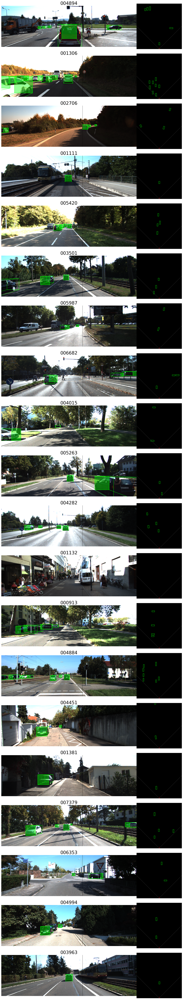

In [3]:
img_names = [i.split('.')[0] for i in os.listdir(IMG_DIR)]

random.shuffle(img_names)
chose_name = img_names[:NUM_IMAGE_SHOW]
chose_name[0] = '004894'
# chose_img  = [cv2.imread(os.path.join(IMG_DIR, f"{i}.png")) for i in chose_name]

# Transform image 
chose_img = []
chose_P2  = []
for name in chose_name:
    img = cv2.imread(os.path.join(IMG_DIR, f"{name}.png"))
    img_ori_h, img_ori_w, _ = img.shape
    
    P2 = kitti_calib_file_parser(os.path.join(CAR_DIR, f"{name}.txt"))

    cv2.line(img, (int(img_ori_w/2) + 124, 0), (int(img_ori_w/2) + 124, img_ori_h), (0,1,0), 1) 
    
    chose_P2.append(P2)
    chose_img.append(img)

axs = init_img_plt(chose_img, titles = chose_name)

for i, img_name in enumerate(chose_name):
    
    # Load annotation
    objs = kitti_label_file_parser(os.path.join(ANO_DIR, f"{img_name}.txt"), tf_matrix = chose_P2[i])

    # Draw annotation on image
    for obj in objs:
        if obj.category == "Car":
            # draw_2Dbox(axs[i][0], (obj.xmin, obj.ymin, obj.xmax, obj.ymax), color = (0,1,0))
            draw_birdeyes(axs[i][1], obj, color = (0,1,0), title = "123", is_print_confident = False)
            draw_corner_2D(axs[i][0], obj.corner_2D, color = (0,1,0), is_draw_front = True)

